# **Import Library**

In [1]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg #untuk read image
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report
from PIL import Image # PIL/pillow untuk manipulasi image rezise,crop, rotation
from google.colab import files
from tensorflow.keras.applications import MobileNetV2
import warnings
import numpy as np # Import numpy
import random # Import random

# Ignore warning
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

In [2]:
import tensorflow as tf
from tensorflow.keras.layers import Layer
from tensorflow.keras.losses import Loss

# =========================================
# CUSTOM LAYER: ScaleLayer
# =========================================

@tf.keras.utils.register_keras_serializable(package='Custom', name='ScaleLayer')
class ScaleLayer(Layer):
    def __init__(self, scale_factor=1.0, **kwargs):
        super(ScaleLayer, self).__init__(**kwargs)
        self.scale_factor = scale_factor

    def call(self, inputs):
        return inputs * self.scale_factor

    def get_config(self):
        config = super().get_config()
        config.update(
            {'scale_factor': self.scale_factor}
        )
        return config

print("Custom Layer 'ScaleLayer' siap digunakan.")

Custom Layer 'ScaleLayer' siap digunakan.


# **Load Data**

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# PATH FOLDER DATASET DI GOOGLE DRIVE

data_train = "/content/drive/MyDrive/Capstone Project/train"
data_test  = "/content/drive/MyDrive/Capstone Project/test"

In [6]:

total_images = sum(len(files) for _, _, files in os.walk(data_train))
print(total_images)

10000


In [7]:
total_images = sum(len(files) for _, _, files in os.walk(data_test))
print(total_images)

2254


# **Prapremosesan Data**

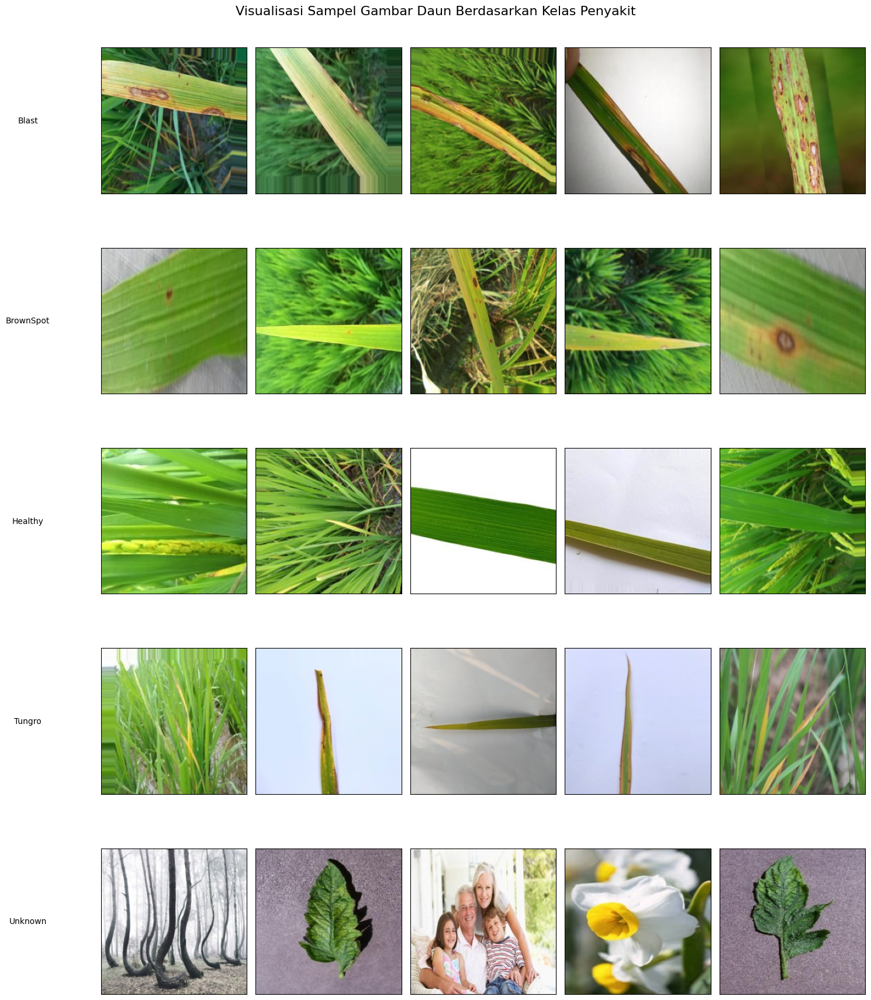

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# =========================================
# VISUALISASI SAMPEL GAMBAR
# =========================================

# Dictionary untuk menyimpan daftar gambar tiap kelas
gambar_daun = {}

# Ambil daftar kelas penyakit dari folder train
daftar_kelas = [
    d for d in os.listdir(data_train)
    if os.path.isdir(os.path.join(data_train, d))
]

# Simpan seluruh path gambar berdasarkan kelas
for nama_kelas in daftar_kelas:

    path_kelas = os.path.join(data_train, nama_kelas)

    if os.path.isdir(path_kelas):

        gambar_daun[nama_kelas] = [

            os.path.join(path_kelas, nama_file)

            for nama_file in os.listdir(path_kelas)

            if os.path.isfile(
                os.path.join(path_kelas, nama_file)
            )
        ]

# Jumlah sampel gambar per kelas
jumlah_sample = 5

# =========================================
# CEK APAKAH DATA ADA
# =========================================

if not gambar_daun:

    print("Tidak ditemukan dataset gambar.")

else:

    # Jumlah kelas
    jumlah_kelas = len(gambar_daun.keys())

    # Membuat subplot
    fig, axs = plt.subplots(
        jumlah_kelas,
        jumlah_sample,
        figsize=(15, 18)
    )

    # Jika hanya ada 1 kelas
    if jumlah_kelas == 1:
        axs = np.expand_dims(axs, axis=0)

    # =========================================
    # VISUALISASI GAMBAR
    # =========================================

    for i, nama_kelas in enumerate(
        sorted(gambar_daun.keys())
    ):

        semua_gambar = gambar_daun[nama_kelas]

        # Jika jumlah gambar kurang dari sample
        if len(semua_gambar) < jumlah_sample:

            gambar_terpilih = np.random.choice(
                semua_gambar,
                len(semua_gambar),
                replace=False
            )

        else:

            gambar_terpilih = np.random.choice(
                semua_gambar,
                jumlah_sample,
                replace=False
            )

        # =========================================
        # TAMPILKAN GAMBAR
        # =========================================

        for j, path_gambar in enumerate(
            gambar_terpilih
        ):

            gambar = Image.open(path_gambar).convert("RGB")

            axs[i, j].imshow(gambar)

            # Label kelas di kolom pertama
            if j == 0:

                axs[i, j].set_ylabel(
                    nama_kelas,
                    fontsize=10,
                    rotation=0,
                    labelpad=90,
                    va='center'
                )

            axs[i, j].set_xticks([])
            axs[i, j].set_yticks([])

        # Menonaktifkan subplot kosong
        for j_kosong in range(
            len(gambar_terpilih),
            jumlah_sample
        ):

            axs[i, j_kosong].axis("off")

    # =========================================
    # JUDUL VISUALISASI
    # =========================================

    plt.suptitle(
        "Visualisasi Sampel Gambar Daun Berdasarkan Kelas Penyakit",
        fontsize=16
    )

    plt.tight_layout()
    plt.show()

# =========================================
# PENGUMPULAN STATISTIK DATASET
# =========================================

# Dictionary statistik
statistik_kelas = {}

# List gambar corrupt
gambar_corrupt = []

# Direktori dataset
direktori_scan = {
    'train': data_train,
    'test': data_test
}

# =========================================
# LOOP SCAN DATASET
# =========================================

for nama_split, direktori_root in direktori_scan.items():

    # Ambil daftar kelas
    daftar_kelas_split = [

        d for d in os.listdir(direktori_root)

        if os.path.isdir(
            os.path.join(direktori_root, d)
        )
    ]

    # Loop setiap kelas
    for nama_kelas in daftar_kelas_split:

        # Inisialisasi statistik
        if nama_kelas not in statistik_kelas:

            statistik_kelas[nama_kelas] = {

                "jumlah_gambar": 0,
                "lebar": [],
                "tinggi": []

            }

        path_kelas = os.path.join(
            direktori_root,
            nama_kelas
        )

        # Ambil semua file gambar
        daftar_gambar = os.listdir(path_kelas)

        for nama_gambar in daftar_gambar:

            path_gambar = os.path.join(
                path_kelas,
                nama_gambar
            )

            # Pastikan file valid
            if os.path.isfile(path_gambar):

                try:

                    gambar = Image.open(path_gambar)

                    lebar, tinggi = gambar.size

                    statistik_kelas[nama_kelas]["lebar"].append(lebar)

                    statistik_kelas[nama_kelas]["tinggi"].append(tinggi)

                    statistik_kelas[nama_kelas]["jumlah_gambar"] += 1

                except Exception:

                    gambar_corrupt.append(path_gambar)

# =========================================
# HITUNG RATA-RATA RESOLUSI
# =========================================

for nama_kelas, statistik in statistik_kelas.items():

    if statistik["jumlah_gambar"] > 0:

        statistik["rata_lebar"] = int(
            np.mean(statistik["lebar"])
        )

        statistik["rata_tinggi"] = int(
            np.mean(statistik["tinggi"])
        )

    else:

        statistik["rata_lebar"] = 0
        statistik["rata_tinggi"] = 0

    # Hapus list sementara
    del statistik["lebar"]
    del statistik["tinggi"]

# =========================================
# TAMPILKAN STATISTIK DATASET
# =========================================

print("\nStatistik Dataset:\n")

for nama_kelas, statistik in statistik_kelas.items():

    print(f"Kelas: {nama_kelas}")

    print(
        f"  Jumlah Gambar : "
        f"{statistik['jumlah_gambar']}"
    )

    print(
        f"  Rata-rata Resolusi : "
        f"{statistik['rata_lebar']} x "
        f"{statistik['rata_tinggi']}"
    )

    print("-" * 40)

# =========================================
# CEK GAMBAR CORRUPT
# =========================================

if gambar_corrupt:

    print("\nDitemukan gambar corrupt:\n")

    for gambar in gambar_corrupt:

        print(gambar)

else:

    print("\nTidak ada gambar corrupt.")

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# =========================================
# PREPROCESSING DATASET
# RESIZE 224x224 (RASIO 1:1)
# =========================================

# Direktori output preprocessing
processed_dir = "/content/processed_224x224"
processed_train_dir = os.path.join(processed_dir, "train")
processed_test_dir = os.path.join(processed_dir, "test")

os.makedirs(processed_train_dir, exist_ok=True)
os.makedirs(processed_test_dir, exist_ok=True)

# Ukuran target
IMG_SIZE = 224

print("=" * 50)
print("PREPROCESSING DATASET DIMULAI")
print("=" * 50)

print(f"Dataset Asal Train : {data_train}")
print(f"Dataset Asal Test  : {data_test}")
print(f"Output Folder      : {processed_dir}")
print(f"Resize Target      : {IMG_SIZE} x {IMG_SIZE}")
print()

# =========================================
# LABEL PENYAKIT
# =========================================

label_penyakit = {

    "Tungro": "Penyakit Tungro",

    "Healthy": "Daun Padi Sehat",

    "BrownSpot": "Bercak Coklat (Brown Spot)",

    "Blast": "Penyakit Blast",

    "Unknown": "Tidak Diketahui"

}

# =========================================
# PREPROCESSING GAMBAR UNTUK TRAIN DAN TEST
# =========================================

total_berhasil = 0
total_gagal = 0

def preprocess_and_save(input_root_dir, output_root_dir):
    global total_berhasil, total_gagal
    daftar_kelas = [
        d for d in os.listdir(input_root_dir)
        if os.path.isdir(os.path.join(input_root_dir, d))
    ]

    for nama_kelas in sorted(daftar_kelas):
        input_kelas = os.path.join(
            input_root_dir,
            nama_kelas
        )

        output_kelas = os.path.join(
            output_root_dir,
            nama_kelas
        )

        os.makedirs(output_kelas, exist_ok=True)

        daftar_gambar = [

            f for f in os.listdir(input_kelas)

            if f.lower().endswith(
                ('.jpg', '.jpeg', '.png')
            )

        ]

        print(f"Memproses kelas: {nama_kelas} di {os.path.basename(output_root_dir)}")
        print(f"Jumlah gambar : {len(daftar_gambar)}")

        for nama_gambar in daftar_gambar:

            path_input = os.path.join(
                input_kelas,
                nama_gambar
            )

            path_output = os.path.join(
                output_kelas,
                nama_gambar
            )

            try:

                # =========================================
                # OPEN IMAGE
                # =========================================

                with Image.open(path_input) as img:

                    # Convert RGB
                    img = img.convert("RGB")

                    # Resize 224x224 (1:1)
                    img = img.resize(
                        (IMG_SIZE, IMG_SIZE)
                    )

                    # Simpan hasil preprocessing
                    img.save(path_output)

                total_berhasil += 1

            except Exception as e:

                total_gagal += 1

                print(f"Gagal memproses: {path_input}")
                print(f"Error: {e}")

        print("-" * 40)


preprocess_and_save(data_train, processed_train_dir)
preprocess_and_save(data_test, processed_test_dir)

print("\nPREPROCESSING SELESAI")
print(f"Berhasil : {total_berhasil}")
print(f"Gagal    : {total_gagal}")

# =========================================
# VISUALISASI DATASET HASIL PREPROCESSING
# =========================================

print("\nMenampilkan visualisasi dataset...")

jumlah_sample = 5

kelas_dataset = [

    d for d in os.listdir(processed_train_dir)

    if os.path.isdir(
        os.path.join(processed_train_dir, d)
    )

]

if not kelas_dataset:

    print("Dataset hasil preprocessing kosong.")

else:

    fig, axs = plt.subplots(

        len(kelas_dataset),

        jumlah_sample,

        figsize=(15, 4 * len(kelas_dataset))

    )

    # Jika hanya 1 kelas
    if len(kelas_dataset) == 1:

        axs = np.expand_dims(axs, axis=0)

    statistik_dataset = {}

    # =========================================
    # LOOP TIAP KELAS
    # =========================================

    for i, nama_kelas in enumerate(
        sorted(kelas_dataset)
    ):

        path_kelas = os.path.join(
            processed_train_dir,
            nama_kelas
        )

        daftar_gambar = [

            f for f in os.listdir(path_kelas)

            if f.lower().endswith(
                ('.jpg', '.jpeg', '.png')
            )

        ]

        # Ambil sample random
        gambar_sample = np.random.choice(

            daftar_gambar,

            min(jumlah_sample, len(daftar_gambar)),

            replace=False

        )

        # =========================================
        # TAMPILKAN GAMBAR
        # =========================================

        for j, nama_gambar in enumerate(
            gambar_sample
        ):

            path_gambar = os.path.join(
                path_kelas,
                nama_gambar
            )

            with Image.open(path_gambar) as img:

                img = img.convert("RGB")

                width, height = img.size

                axs[i, j].imshow(img)

                axs[i, j].set_title(
                    f"{width}x{height}",
                    fontsize=8
                )

                axs[i, j].axis("off")

        # Nonaktifkan subplot kosong
        for j_kosong in range(
            len(gambar_sample),
            jumlah_sample
        ):

            axs[i, j_kosong].axis("off")

        # =========================================
        # LABEL KELAS
        # =========================================

        nama_label = label_penyakit.get(
            nama_kelas,
            nama_kelas
        )

        axs[i, 0].set_ylabel(

            f"{nama_kelas}\n({nama_label})",

            fontsize=10,

            rotation=0,

            labelpad=80,

            va='center'

        )

        # =========================================
        # STATISTIK
        # =========================================

        statistik_dataset[nama_kelas] = {

            "jumlah_gambar": len(daftar_gambar),

            "resolusi": f"{IMG_SIZE} x {IMG_SIZE}"

        }

    plt.suptitle(

        "Visualisasi Dataset Setelah Resize 224x224 (1:1)",

        fontsize=16

    )

    plt.tight_layout()

    plt.show()

# =========================================
# STATISTIK DATASET
# =========================================

print("\n" + "=" * 50)
print("STATISTIK DATASET")
print("=" * 50)

for nama_kelas, statistik in statistik_dataset.items():

    nama_label = label_penyakit.get(
        nama_kelas,
        nama_kelas
    )

    print(f"\nKelas: {nama_kelas}")
    print(f"Label Penyakit   : {nama_label}")
    print(f"Jumlah Gambar    : {statistik['jumlah_gambar']}")
    print(f"Resolusi Gambar  : {statistik['resolusi']}")

print("\nSeluruh gambar berhasil diubah menjadi rasio 1:1 dengan ukuran 224x224 piksel.")

In [ ]:
# Hitung Jumlah Data per Kelas Train
class_counts = {}

for cls in os.listdir(data_train):
    class_path = os.path.join(data_train, cls)

    if os.path.isdir(class_path):
        count = len([
            f for f in os.listdir(class_path)
            if f.lower().endswith(('.jpg', '.png', '.jpeg'))
        ])
        class_counts[cls] = count

print("Jumlah awal per kelas:")
print(class_counts)

# Target = kelas terbesar
target_size = max(class_counts.values())

print("\nTarget size:", target_size)

# **Modelling**

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.losses import Loss

# =========================================
# CUSTOM LOSS FUNCTION:
# =========================================

# Definisikan sebagai kelas yang mewarisi dari tf.keras.losses.Loss
@tf.keras.utils.register_keras_serializable(package='Custom', name='WeightedCategoricalCrossentropy')
class WeightedCategoricalCrossentropy(Loss):
    def __init__(self, weights, name="weighted_categorical_crossentropy_loss", **kwargs):
        super().__init__(name=name, **kwargs)
        self.weights = tf.constant(weights, dtype=tf.float32)

    def call(self, y_true, y_pred):
        y_pred /= tf.reduce_sum(y_pred, axis=-1, keepdims=True)

        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1. - tf.keras.backend.epsilon())

        cross_entropy = y_true * tf.math.log(y_pred) * self.weights

        return -tf.reduce_sum(cross_entropy, axis=-1)

    def get_config(self):
        config = super().get_config()
        config.update({
            "weights": self.weights.numpy().tolist()
        })
        return config

def build_transfer_model(input_shape, num_classes=4, use_scale_layer=True, custom_loss=None):

    # Load Base Model Pretrained
    base_model = tf.keras.applications.MobileNetV2(
        input_shape=input_shape,
        include_top=False,
        weights='imagenet'
    )

    # Freeze Base Model
    base_model.trainable = False

    # Input Layer
    inputs = Input(shape=input_shape)

    # Feature Extraction
    x = base_model(inputs, training=False)

    # Add custom ScaleLayer if enabled
    if use_scale_layer:
        x = ScaleLayer(scale_factor=0.5)(x)
        print("ScaleLayer diterapkan setelah base model.")

    # Global Average Pooling
    x = GlobalAveragePooling2D()(x)

    # Fully Connected Layer
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)

    # Output Layer
    outputs = Dense(num_classes, activation='softmax')(x)

    # Build Model
    model = Model(inputs, outputs, name="mobilenetv2_transfer")

    # Determine loss function
    loss_fn = 'categorical_crossentropy'
    if custom_loss is not None:
        loss_fn = custom_loss #
        print("Menggunakan custom loss function.")

    # Compile Model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss=loss_fn,
        metrics=['accuracy']
    )

    return model


# Mendapatkan bobot kelas untuk custom loss
class_weights_dict = {
    'Blast': 1.0,
    'BrownSpot': 1.0,
    'Healthy': 1.0,
    'Tungro': 1.0,
    'Unknown': 1.0
}

ordered_class_labels = ['Blast', 'BrownSpot', 'Healthy', 'Tungro', 'Unknown']
loss_weights = [class_weights_dict[label] for label in ordered_class_labels]

# Membuat Model dengan ScaleLayer dan Custom Loss
tl_model = build_transfer_model(
    input_shape=(224, 224, 3),
    num_classes=len(ordered_class_labels),
    use_scale_layer=True,
    custom_loss=WeightedCategoricalCrossentropy(loss_weights)
)

# Ringkasan Model
tl_model.summary()

In [ ]:
# Rebuild the model after ScaleLayer

# Mendapatkan bobot kelas untuk custom loss
class_weights_dict = {
    'Blast': 1.0,
    'BrownSpot': 1.0,
    'Healthy': 1.0,
    'Tungro': 1.0,
    'Unknown': 1.0
}

# Convert dictionary to a list of weights in the order of class_labels
ordered_class_labels = ['Blast', 'BrownSpot', 'Healthy', 'Tungro', 'Unknown']
loss_weights = [class_weights_dict[label] for label in ordered_class_labels]

tl_model = build_transfer_model(
    input_shape=(224, 224, 3),
    num_classes=len(ordered_class_labels),
    use_scale_layer=True,
    custom_loss=WeightedCategoricalCrossentropy(loss_weights)
)

# Ringkasan Model
tl_model.summary()

In [ ]:
import tensorflow as tf

# =========================================
# CUSTOM CALLBACK UNTUK CUSTOM TRAINING LOOP
# =========================================

class CustomTrainingCallback(tf.keras.callbacks.Callback):
    """
    Callback kustom untuk menangani logging dalam custom training loop dengan tf.GradientTape.
    Early stopping will be handled by tf.keras.callbacks.EarlyStopping.
    """
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def on_epoch_begin(self, epoch, logs=None):
        # Metode ini dipanggil di awal setiap epoch.
        # Untuk callback ini, tidak ada logika khusus yang diperlukan di sini.
        pass

    def on_epoch_end(self, epoch, logs=None):
        # Metode ini dipanggil di akhir setiap epoch.
        logs = logs or {}
        train_loss = logs.get('loss')
        train_accuracy = logs.get('accuracy')
        val_loss = logs.get('val_loss')
        val_accuracy = logs.get('val_accuracy')

        print(f"\n>>>> Epoch {epoch + 1} SELESAI: ") # epoch dimulai dari 0 di Keras callbacks
        print(f"   Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
        print(f"   Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}\n")

        # =====================================
        # STOP TRAINING OTOMATIS Kustom
        # =====================================
        # Menghentikan training jika validation accuracy mencapai 97% (custom logic)
        if val_accuracy is not None and val_accuracy >= 0.97:
            print(f"Validation Accuracy mencapai 97% atau lebih. Menghentikan pelatihan otomatis.")
            # Set stop_training flag on the model object (which is the DummyModel in this case)
            self.model.stop_training = True

print("Custom Callback 'CustomTrainingCallback' siap digunakan.")

Custom Callback 'CustomTrainingCallback' siap digunakan.


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau # Import callbacks

# =========================================
# CALLBACKS
# =========================================
callbacks = [
    # Early Stopping
    EarlyStopping(
        monitor='val_accuracy',
        patience=5,
        restore_best_weights=True,
        verbose=1,
        mode='max'
    ),
    # Reduce Learning Rate on Plateau
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-7,
        verbose=1,
        mode='min'
    ),
    CustomTrainingCallback() # Instantiate and add your custom callback here
]

In [ ]:
base_model = tl_model.get_layer("mobilenetv2_1.00_224")

# Aktifkan fine-tuning
base_model.trainable = True

# Bekukan sebagian layer awal (fitur dasar)
fine_tune_at = 100

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# Compile ulang dengan learning rate kecil, menggunakan WeightedCategoricalCrossentropy
tl_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss=WeightedCategoricalCrossentropy(loss_weights),
    metrics=['accuracy']
)

print("Fine tuning siap dijalankan ")

Fine tuning siap dijalankan 


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import datetime
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# =========================================
# MENENTUKAN UKURAN GAMBAR DAN BATCH SIZE
# =========================================
TARGET_SIZE = (224, 224)
BATCH_SIZE = 32
processed_dir = "/content/processed_224x224"

# Preprocessing data
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

# Generator
train_generator = train_datagen.flow_from_directory(
    os.path.join(processed_dir, 'train'),
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

validation_generator = validation_datagen.flow_from_directory(
    os.path.join(processed_dir, 'test'),
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Mapping kelas
class_indices = train_generator.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}
class_labels = [idx_to_class[i] for i in sorted(idx_to_class.keys())]

# =========================================
# UNFREEZE BASE MODEL (MobileNetV2 Fine Tuning)
# =========================================

# =========================================
# SETUP CUSTOM LOSS, METRICS, & TENSORBOARD
# =========================================
log_dir_custom = "logs/fit/custom_gradient_tape/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_summary_writer = tf.summary.create_file_writer(os.path.join(log_dir_custom, 'train'))
val_summary_writer = tf.summary.create_file_writer(os.path.join(log_dir_custom, 'validation'))

# Mengambil optimizer dan loss dari model yang sudah dikompilasi
optimizer = tl_model.optimizer
loss_object = tl_model.loss

# Definisikan objek metrik di scope global agar aman diakses oleh @tf.function
train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.CategoricalAccuracy(name='train_accuracy')
val_loss = tf.keras.metrics.Mean(name='val_loss')
val_accuracy = tf.keras.metrics.CategoricalAccuracy(name='val_accuracy')

# Fungsi Train Step & Val Step (Langsung membaca metrik global)
@tf.function
def train_step(images, labels):
    with tf.GradientTape() as tape:
        predictions = tl_model(images, training=True)
        loss = loss_object(labels, predictions)
    gradients = tape.gradient(loss, tl_model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, tl_model.trainable_variables))
    train_loss(loss)
    train_accuracy(labels, predictions)

@tf.function
def val_step(images, labels):
    predictions = tl_model(images, training=False)
    t_loss = loss_object(labels, predictions)
    val_loss(t_loss)
    val_accuracy(labels, predictions)

# =========================================
# TIMING & FIX UNTUK LOOP GENERATOR
# =========================================
print("\nMemulai pelatihan kustom dengan tf.GradientTape...")
EPOCHS = 30

# Inisialisasi history_stage1
history_stage1 = {'loss': [], 'accuracy': [], 'val_loss': [], 'val_accuracy': []}

# Hitung jumlah langkah (steps) per epoch agar tidak infinite loop
steps_per_epoch = int(np.ceil(train_generator.samples / train_generator.batch_size))
validation_steps = int(np.ceil(validation_generator.samples / validation_generator.batch_size))


# We will use a dummy Keras Model to initialize the callbacks.
class DummyModel(tf.keras.Model):
    def __init__(self, optimizer, loss, metrics):
        super().__init__()
        self.optimizer = optimizer
        self.compiled_loss = loss # Use compiled_loss for consistency
        # self.compiled_metrics = metrics # This line caused the error. Remove or comment out.
        # Add attributes expected by callbacks
        self.stop_training = False
        self.history = {} # Initialize history for callbacks to record

    def get_layer(self, name=None, index=None):
        return tl_model.get_layer(name, index)

dummy_keras_model = DummyModel(optimizer, loss_object, [train_accuracy, val_accuracy])

# Manually set the model for each callback and initialize them
for callback in callbacks:
    callback.set_model(dummy_keras_model)
    callback.set_params({
        'epochs': EPOCHS,
        'steps': steps_per_epoch,
        'verbose': 0, # Manage verbosity manually for custom loop
        'do_on_batch': False, # We are not calling on_batch_end
        'metrics': ['loss', 'accuracy', 'val_loss', 'val_accuracy'] # Ensure metrics are set
    })

# Call on_train_begin for all callbacks
for callback in callbacks:
    callback.on_train_begin()

# Flag for early stopping
stop_training_flag = False

for epoch in range(EPOCHS):
    # Call on_epoch_begin for all callbacks
    for callback in callbacks:
        callback.on_epoch_begin(epoch)

    if dummy_keras_model.stop_training:
        print(f"Pelatihan dihentikan setelah Epoch {epoch} karena EarlyStopping callback.")
        stop_training_flag = True
        break

    # Gunakan .reset_state() bawaan untuk mengosongkan nilai metrik di tiap awal epoch
    train_loss.reset_state()
    train_accuracy.reset_state()
    val_loss.reset_state()
    val_accuracy.reset_state()

    # 1. FIXED Training Loop
    train_generator.reset()
    for batch_idx in range(steps_per_epoch):
        images, labels = next(train_generator)
        train_step(images, labels) # Tidak perlu mempassing metrik lagi

        if batch_idx % 50 == 0:
            print(f"  Epoch {epoch + 1}, Batch {batch_idx}/{steps_per_epoch}: "
                  f"Loss: {train_loss.result():.4f}, Accuracy: {train_accuracy.result():.4f}")

    # 2. FIXED Validation Loop
    validation_generator.reset()
    for _ in range(validation_steps):
        images, labels = next(validation_generator)
        val_step(images, labels) # Tidak perlu mempassing metrik lagi

    # Collect epoch results for callbacks
    epoch_logs = {
        'loss': train_loss.result().numpy(),
        'accuracy': train_accuracy.result().numpy(),
        'val_loss': val_loss.result().numpy(),
        'val_accuracy': val_accuracy.result().numpy(),
        'lr': optimizer.learning_rate.numpy() # Get current learning rate
    }

    # Update history_stage1 for plotting
    history_stage1['loss'].append(epoch_logs['loss'])
    history_stage1['accuracy'].append(epoch_logs['accuracy'])
    history_stage1['val_loss'].append(epoch_logs['val_loss'])
    history_stage1['val_accuracy'].append(epoch_logs['val_accuracy'])

    # 3. Logging ke TensorBoard
    with train_summary_writer.as_default():
        tf.summary.scalar('loss', train_loss.result(), step=epoch)
        tf.summary.scalar('accuracy', train_accuracy.result(), step=epoch)
        tf.summary.scalar('learning_rate', optimizer.learning_rate.numpy(), step=epoch)

    with val_summary_writer.as_default():
        tf.summary.scalar('loss', val_loss.result(), step=epoch)
        tf.summary.scalar('accuracy', val_accuracy.result(), step=epoch)

    # Call on_epoch_end for all callbacks and pass the logs
    for callback in callbacks:
        callback.on_epoch_end(epoch, epoch_logs)

# Call on_train_end for all callbacks
for callback in callbacks:
    callback.on_train_end()

print("\nPelatihan kustom selesai.")

Found 10000 images belonging to 5 classes.
Found 2254 images belonging to 5 classes.

Memulai pelatihan kustom dengan tf.GradientTape...
  Epoch 1, Batch 0/313: Loss: 1.8443, Accuracy: 0.0938
  Epoch 1, Batch 50/313: Loss: 1.5899, Accuracy: 0.2904
  Epoch 1, Batch 100/313: Loss: 1.4684, Accuracy: 0.3800
  Epoch 1, Batch 150/313: Loss: 1.3737, Accuracy: 0.4534
  Epoch 1, Batch 200/313: Loss: 1.2943, Accuracy: 0.5062
  Epoch 1, Batch 250/313: Loss: 1.2226, Accuracy: 0.5492
  Epoch 1, Batch 300/313: Loss: 1.1563, Accuracy: 0.5828

>>>> Epoch 1 SELESAI: 
   Train Loss: 1.1402, Train Accuracy: 0.5903
   Validation Loss: 0.8901, Validation Accuracy: 0.7121

  Epoch 2, Batch 0/313: Loss: 0.7386, Accuracy: 0.8125
  Epoch 2, Batch 50/313: Loss: 0.7003, Accuracy: 0.7935
  Epoch 2, Batch 100/313: Loss: 0.6662, Accuracy: 0.8069
  Epoch 2, Batch 150/313: Loss: 0.6498, Accuracy: 0.8082
  Epoch 2, Batch 200/313: Loss: 0.6263, Accuracy: 0.8106
  Epoch 2, Batch 250/313: Loss: 0.6012, Accuracy: 0.8174
 

### Meluncurkan TensorBoard untuk Custom Training

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/fit/custom_gradient_tape

<IPython.core.display.Javascript object>

In [ ]:
# Mengambil mapping kelas dari TRAIN
class_indices = train_generator.class_indices

# Membalik mapping: index nama kelas
idx_to_class = {v: k for k, v in class_indices.items()}

# Urutkan label
class_labels = [idx_to_class[i] for i in sorted(idx_to_class.keys())]

# Tampilkan
print("Class Indices:")
print(class_indices)

print("\nOrdered Class Labels:")
print(class_labels)

Class Indices:
{'Blast': 0, 'BrownSpot': 1, 'Healthy': 2, 'Tungro': 3, 'Unknown': 4}

Ordered Class Labels:
['Blast', 'BrownSpot', 'Healthy', 'Tungro', 'Unknown']


In [ ]:
def plot_training_history(history, model_name):
    """
    Visualisasi akurasi dan loss selama training
    """
    acc = history.history.get('accuracy', [])
    val_acc = history.history.get('val_accuracy', [])
    loss = history.history.get('loss', [])
    val_loss = history.history.get('val_loss', [])

    epochs_range = range(len(acc))

    plt.figure(figsize=(14, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Train Accuracy')
    plt.plot(epochs_range, val_acc, label='Val Accuracy', linestyle='--')
    plt.title(f'{model_name} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Train Loss')
    plt.plot(epochs_range, val_loss, label='Val Loss', linestyle='--')
    plt.title(f'{model_name} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

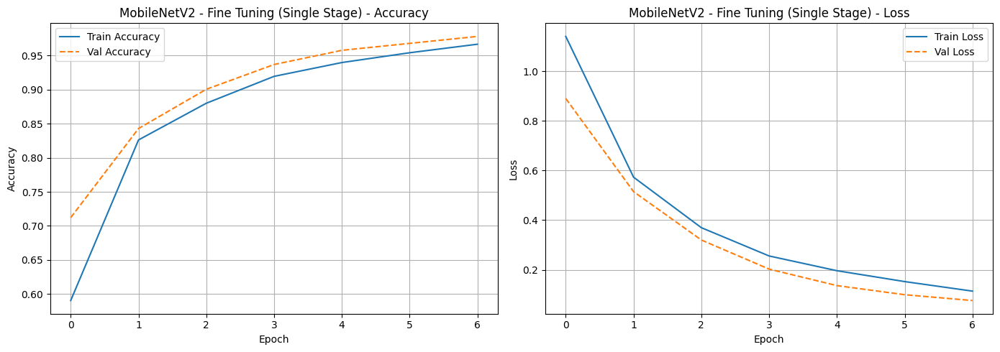

In [ ]:
# MobileNetV2 Fine-tuning (Single Stage)

# Create a dummy History object to match the plot_training_history function's expectation
class DummyHistory:
    def __init__(self, data):
        self.history = data

wrapped_history = DummyHistory(history_stage1)

plot_training_history(wrapped_history, "MobileNetV2 - Fine Tuning (Single Stage)")

# **Evaluasi dan Visualisasi**

In [ ]:
def evaluate_and_report(model, generator, model_name):

    print(f"\n--- Evaluasi Detail: {model_name} ---")

    # 1. Evaluasi dasar
    loss, accuracy = model.evaluate(generator, verbose=0)
    print(f"Test Loss    : {loss:.4f}")
    print(f"Test Accuracy: {accuracy*100:.2f}%")

    # 2. Ambil label kelas
    class_indices = generator.class_indices
    idx_to_class = {v: k for k, v in class_indices.items()}
    class_labels = [idx_to_class[i] for i in sorted(idx_to_class.keys())]

    # 3. Prediksi
    generator.reset()
    predictions = model.predict(generator, verbose=0)

    y_pred = np.argmax(predictions, axis=1)
    y_true = generator.classes

    # 4. Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_labels,
                yticklabels=class_labels)

    plt.title(f'Confusion Matrix - {model_name}')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.show()

    # 5. Classification Report
    print("\nClassification Report:\n")
    print(classification_report(
        y_true,
        y_pred,
        target_names=class_labels,
        zero_division=0
    ))


--- Evaluasi Detail: MobileNetV2 Transfer Learning ---
Test Loss    : 0.0766
Test Accuracy: 97.83%


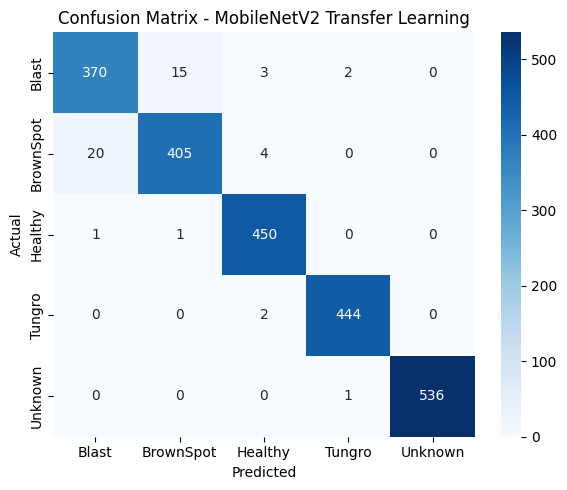


Classification Report:

              precision    recall  f1-score   support

       Blast       0.95      0.95      0.95       390
   BrownSpot       0.96      0.94      0.95       429
     Healthy       0.98      1.00      0.99       452
      Tungro       0.99      1.00      0.99       446
     Unknown       1.00      1.00      1.00       537

    accuracy                           0.98      2254
   macro avg       0.98      0.98      0.98      2254
weighted avg       0.98      0.98      0.98      2254



In [ ]:
# Jalankan Evaluasi
evaluate_and_report(tl_model, validation_generator, "MobileNetV2 Transfer Learning")

# **Konversi Model**

In [ ]:
import os
import tensorflow as tf

# 1. Tentukan direktori output
SAVED_MODEL_DIR = "RiceCareAI/Model_RiceCareAI"
os.makedirs(SAVED_MODEL_DIR, exist_ok=True)

print(f"Mengekspor tl_model ke SavedModel di: {SAVED_MODEL_DIR}...")

try:
    # Menggunakan model.export() untuk menyimpan dalam format SavedModel
    # Ini adalah cara yang direkomendasikan untuk Keras 3.x dan TensorFlow 2.x
    tl_model.export(SAVED_MODEL_DIR)
    print("\n--> [SUKSES] Model berhasil disimpan dalam format SavedModel.")
except Exception as e:
    print(f"\n[GAGAL] Gagal menyimpan model menggunakan model.export(): {e}")
    print("Mencoba menyimpan dengan metode cadangan (.keras format)...")
    # Jika model.export() gagal, simpan sebagai file .keras
    backup_path = os.path.join(SAVED_MODEL_DIR, "RiceCareAI.keras")
    tl_model.save(backup_path)
    print(f"--> [SUKSES VIA CADANGAN MODEL] Model berhasil disimpan di: {backup_path}")

print("Proses penyimpanan model selesai.")

Mengekspor tl_model ke SavedModel di: RiceCareAI/Model_RiceCareAI...
Saved artifact at 'RiceCareAI/Model_RiceCareAI'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_315')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  136621436876752: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136621436876560: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136621436877712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136621436877328: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136621436877520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136621436876944: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136621436874256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136621436878096: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136621436875408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  

In [ ]:
import shutil

# Bungkus folder "RiceCareAI" secara utuh menjadi "Model_RiceCareAI.zip"
shutil.make_archive("Model_RiceCareAI", "zip", "RiceCareAI")
print("SUCCESS: File Model_RiceCareAI.zip berhasil dibuat dan siap di-download!")

SUCCESS: File Model_RiceCareAI.zip berhasil dibuat dan siap di-download!


# **Inference**

Upload Gambar


Saving images (1).jpg to images (1) (1).jpg


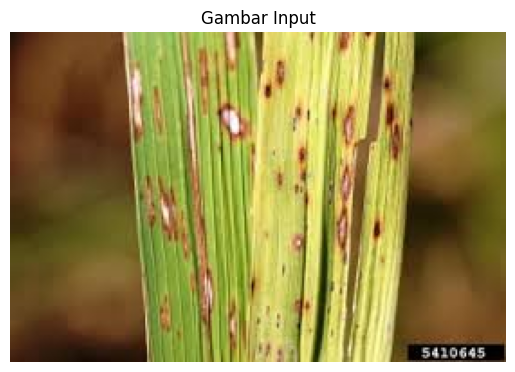


===== HASIL ====
Prediksi : BrownSpot
Akurasi  : 93.20%

Probabilitas untuk semua kelas:
  Blast: 3.23%
  BrownSpot: 93.20%
  Healthy: 1.44%
  Tungro: 1.45%
  Unknown: 0.69%


In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing import image
from google.colab import files
import matplotlib.pyplot as plt
import os
from PIL import Image
from __main__ import ScaleLayer, WeightedCategoricalCrossentropy

# =========================
# 1. LOAD MODEL
# =========================
# Use the path where the model was successfully saved in a previous step
SAVED_MODEL_PATH = "RiceCareAI/Model_RiceCareAI"
model = tf.keras.layers.TFSMLayer(
    SAVED_MODEL_PATH,
    call_endpoint='serve'
)


label_dir = "Model_RiceCareAI/tflite"
os.makedirs(label_dir, exist_ok=True)

with open(os.path.join(label_dir, "label.txt"), "w") as f:
    for label in class_labels:
        f.write(label + "\n")

# =========================
# 2. LOAD LABEL
# =========================
with open(os.path.join(label_dir, "label.txt"), "r") as f:
    labels = f.read().splitlines()

# =========================
# 3. UPLOAD GAMBAR
# =========================
print("Upload Gambar")
uploaded = files.upload()

if not uploaded:
    print("Tidak ada gambar yang diunggah. Silakan unggah satu gambar untuk analisis.")
else:
    img_path = list(uploaded.keys())[0]

    # =========================
    # 4. TAMPILKAN GAMBAR
    # =========================
    img_display = Image.open(img_path)
    plt.imshow(img_display)
    plt.axis('off')
    plt.title("Gambar Input")
    plt.show()

    # =========================
    # 5. PREPROCESS (Consistent with training and API)
    # =========================
    IMG_SIZE = 224 # Make sure IMG_SIZE is defined for consistency

    with Image.open(img_path) as img:
        img = img.convert("RGB")
        img = img.resize((IMG_SIZE, IMG_SIZE), Image.LANCZOS)
        img_array = np.array(img).astype(np.float32)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = img_array / 255.0

    # =========================
    # 6. PREDIKSI
    # =========================
    pred = model(img_array)

    # Convert ke numpy
    pred = pred.numpy() if hasattr(pred, "numpy") else np.array(pred)

    # Ambil hasil terbaik
    pred_class = np.argmax(pred[0])
    confidence = np.max(pred[0])

    # =========================
    # 7. OUTPUT FINAL
    # =========================
    output_message = []

    output_message.append(f"Prediksi : {labels[pred_class]}")
    output_message.append(f"Akurasi  : {confidence*100:.2f}%")

    print("\n===== HASIL ====")
    for msg in output_message:
        print(msg)

    # Display all probabilities
    print("\nProbabilitas untuk semua kelas:")
    for i, p in enumerate(pred[0]):
        print(f"  {labels[i]}: {p*100:.2f}%")

## Deploy Model with FastAPI


In [ ]:
# Install FastAPI and Uvicorn
!pip install fastapi uvicorn python-multipart

In [ ]:
from fastapi import FastAPI, UploadFile, File, HTTPException
from pydantic import BaseModel
import uvicorn
import numpy as np
import tensorflow as tf
from PIL import Image
import io

custom_objects = {
    'ScaleLayer': ScaleLayer,
    'WeightedCategoricalCrossentropy': WeightedCategoricalCrossentropy
}

# 0. DIRECTORY MODEL ARTIFACT
SAVED_MODEL_DIR = "RiceCareAI/Model_RiceCareAI"

# 1. LOAD MODEL
model_api = tf.keras.layers.TFSMLayer(
    SAVED_MODEL_DIR,
    call_endpoint='serve'
)

# 2. DEFINISIKAN LABEL (Sesuaikan urutan dengan dataset kamu)
class_labels_api = class_labels

app = FastAPI(title="Paddy Disease Classification API")

class PredictionResponse(BaseModel):
    filename: str
    prediction: str
    confidence: float
    message: str = "Prediction successful."

@app.post("/predict", response_model=PredictionResponse)
async def predict(file: UploadFile = File(...)):
    # Baca gambar yang diupload
    contents = await file.read()

    # Preprocessing menggunakan PIL (konsisten dengan tf.keras.preprocessing.image.load_img)
    try:
        img = Image.open(io.BytesIO(contents)).convert('RGB')

        # Dapatkan rasio aspek
        width, height = img.size
        aspect_ratio = width / height
        IMG_SIZE = 224 # Define IMG_SIZE for consistent preprocessing

        # Tentukan ukuran resize baru untuk mempertahankan rasio aspek
        if width < height:
            new_width = IMG_SIZE
            new_height = int(IMG_SIZE / aspect_ratio)
        else:
            new_height = IMG_SIZE
            new_width = int(IMG_SIZE * aspect_ratio)

        img = img.resize((new_width, new_height), Image.LANCZOS)

        # Lakukan crop tengah untuk mendapatkan IMG_SIZE x IMG_SIZE
        left = (new_width - IMG_SIZE) / 2
        top = (new_height - IMG_SIZE) / 2
        right = (new_width + IMG_SIZE) / 2
        bottom = (new_height + IMG_SIZE) / 2

        img = img.crop((left, top, right, bottom))

        img_array = np.array(img).astype(np.float32)
        img_array = img_array / 255.0
        img_array = np.expand_dims(img_array, axis=0)
    except Exception as e:
        raise HTTPException(status_code=400, detail=f"Could not process image: {e}")


    # Prediksi
    predictions = model_api(img_array)

    # Convert ke numpy
    predictions = predictions.numpy() if hasattr(predictions, "numpy") else np.array(predictions)

    highest_pred_idx = np.argmax(predictions[0])

    # Ambil hasil
    result_label = class_labels_api[highest_pred_idx]
    confidence_score = float(np.max(predictions[0]))

    return {
        "filename": file.filename,
        "prediction": result_label,
        "confidence": confidence_score,
        "message": "Prediction successful."
    }

### Run the FastAPI server in Colab


In [ ]:
!pip install pyngrok

In [ ]:
from pyngrok import ngrok, conf
from google.colab import userdata
import threading
import time
import subprocess

# Kill any running ngrok tunnels from previous sessions
ngrok.kill()

TOKEN_NGROK = userdata.get('TOKEN_NGROK')
conf.get_default().auth_token = TOKEN_NGROK

# Define the port for Uvicorn
UVICORN_PORT = 8005 # Changed port from 8004 to 8005

# Function to run Uvicorn
def run_uvicorn():
    try:
        uvicorn.run(app, host="0.0.0.0", port=UVICORN_PORT)
    except Exception as e:
        print(f"Error starting Uvicorn: {e}")

uvicorn_thread = threading.Thread(target=run_uvicorn)
uvicorn_thread.start()
time.sleep(5)

try:
    public_url = ngrok.connect(UVICORN_PORT)
    print(f"Public URL: {public_url}")
    print(f"API Docs: {public_url}/docs")
except Exception as e:
    print(f"Error connecting ngrok: {e}")
    print("Please ensure Uvicorn started correctly and the ngrok auth token is valid.")


INFO:     Started server process [1555]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8005 (Press CTRL+C to quit)


Public URL: NgrokTunnel: "https://unstable-palm-reptilian.ngrok-free.dev" -> "http://localhost:8005"
API Docs: NgrokTunnel: "https://unstable-palm-reptilian.ngrok-free.dev" -> "http://localhost:8005"/docs
